In [1]:
include(joinpath("..","src","setup.jl"))
datadir = joinpath("..","data","count_lengths","run_2018-11-26")
using VegaLite
PlotAxes.set_backend!(:vegalite)

HTML{String}("<script>\n// Immediately-invoked-function-expression to avoid global variables.\n(function() {\n    var warning_div = document.getElementById(\"webio-warning-10254320215598457237\");\n    var hide = function () {\n        var script = document.getElementById(\"webio-setup-160319667747598247\");\n        var parent = script && script.parentElement;\n        var grandparent = parent && parent.parentElement;\n        if (grandparent) {\n            grandparent.style.display = \"none\";\n        }\n        warning_div.style.display = \"none\";\n    };\n    if (typeof Jupyter !== \"undefined\") {\n        console.log(\"WebIO detected Jupyter notebook environment.\");\n        // Jupyter notebook.\n        var extensions = (\n            Jupyter\n            && Jupyter.notebook.config.data\n            && Jupyter.notebook.config.data.load_extensions\n        );\n        if (extensions && extensions[\"webio-jupyter-notebook\"]) {\n            // Extension already loaded.\n            console.log(\"Jupyter WebIO nbextension detected; not loading ad-hoc.\");\n            hide();\n            return;\n        }\n    } else if (window.location.pathname.includes(\"/lab\")) {\n        // Guessing JupyterLa\n        console.log(\"Jupyter Lab detected; make sure the @webio/jupyter-lab-provider labextension is installed.\");\n        hide();\n        return;\n    }\n})();\n\n</script>\n<p\n    id=\"webio-warning-10254320215598457237\"\n    class=\"output_text output_stderr\"\n    style=\"padding: 1em; font-weight: bold;\"\n>\n    Unable to load WebIO. Please make sure WebIO works for your Jupyter client.\n    For troubleshooting, please see <a href=\"https://juliagizmos.github.io/WebIO.jl/latest/providers/ijulia/\">\n    the WebIO/IJulia documentation</a>.\n    <!-- TODO: link to installation docs. -->\n</p>\n")

Activating environment at `~/Documents/work/projects/bistable/Project.toml`


┌ Info: Loading DataFrames support into Gadfly.jl
└ @ Gadfly /Users/davidlittle/.julia/packages/Gadfly/09PWZ/src/mapping.jl:228
┌ Info: Loading Gadfly backend for `PlotAxes`
└ @ PlotAxes /Users/davidlittle/.julia/packages/PlotAxes/CavBN/src/PlotAxes.jl:359
┌ Info: Loading VegaLite backend for `PlotAxes`
└ @ PlotAxes /Users/davidlittle/.julia/packages/PlotAxes/CavBN/src/PlotAxes.jl:352


:vegalite

In [2]:
using WebIO
WebIO.install_jupyter_nbextension()

┌ Info: Installing Jupyter WebIO extension...
│   cmd = `/Users/davidlittle/miniconda3/bin/jupyter nbextension install --user /Users/davidlittle/.julia/packages/WebIO/2nnB1/deps/bundles/webio-jupyter-notebook.js`
└ @ WebIO /Users/davidlittle/.julia/packages/WebIO/2nnB1/deps/jupyter.jl:237
Up to date: /Users/davidlittle/Library/Jupyter/nbextensions/webio-jupyter-notebook.js

    To initialize this nbextension in the browser every time the notebook (or other app) loads:
    
          jupyter nbextension enable <the entry point> --user
    
┌ Info: Enabling Jupyter WebIO extension...
│   cmd = `/Users/davidlittle/miniconda3/bin/jupyter nbextension enable --user webio-jupyter-notebook`
└ @ WebIO /Users/davidlittle/.julia/packages/WebIO/2nnB1/deps/jupyter.jl:241
Enabling notebook extension webio-jupyter-notebook...
      - Validating: OK


In [3]:
params = load_params(joinpath(datadir,"params.jld2"))
params.pindex = 1:size(params,1)
settings = joinpath("..","src","settings.toml")
settings = TOML.parsefile(settings)
settings["stimulus"]["repeats"] = 96 #48

96

In [4]:
p = copy(params[select_params(params,f_c_a=5,f_c_m=5,Δf=6),:])
p.f_c_σ .= 0.2
p.s_c_a .= 5
p.s_c_m .= 5
p.s_c_σ .= 0.5
p.t_c_a .= 5
p.t_c_m .= 5
p.t_c_σ .= 0.5

1-element Array{Float64,1}:
 0.5

# Object model

In [5]:
p = copy(params[select_params(params,t_c_a=5,t_c_m=5,Δf=6),:])

,f_W_m_σ,f_c_m,t_c_a,t_c_m,f,t_W_m_c,t_c_x,f_c_x,t_W_m_σ_t
,Float64,Float64,Float64,Float64,Quantity…,Float64,Float64,Float64,Float64
1,5.6,0.0,5.0,5.0,500 Hz,6.0,3.0,3.0,7.0


In [134]:
p.t_c_a .= 20
p.t_c_m .= 1

1-element Array{Float64,1}:
 1.0

In [135]:
Random.seed!(666)
result = bistable_model(p,settings,intermediate_results=true);

┌ Info: 0.22% of frames (n = 1) failed to fully converge to a solution.
└ @ AuditoryBistabilityLE /Users/davidlittle/Documents/work/projects/bistable/src/AuditoryBistabilityLE/src/nmf.jl:47


In [136]:
function cleanparam(x)
    x = replace(x, r"\(3.0 s, ([0-9\.]+)" => s"β = \1")
    x = replace(x, r"(?<=, )([0-9\.]+)(?=\))" => pat -> "κ = $(Int(parse(Float64,pat)/10))s/Δt")
    x = replace(x, ")" => "")
end

cleanparam (generic function with 1 method)

In [137]:
df, = PlotAxes.asplotable(result.sources.outweights[10s .. 20s],quantize=(100,10));
first(df,6)

df.beta = parse.(Float64,replace.(df.params, r"\(3.0 s, ([0-9\.]+), .*" => s"\1"));
df.kappa = parse.(Float64,replace.(df.params, r"\(.*, ([0-9\.]+)\)" => s"\1"));
df.params = cleanparam.(df.params);

WARN row encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).
WARN row encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).


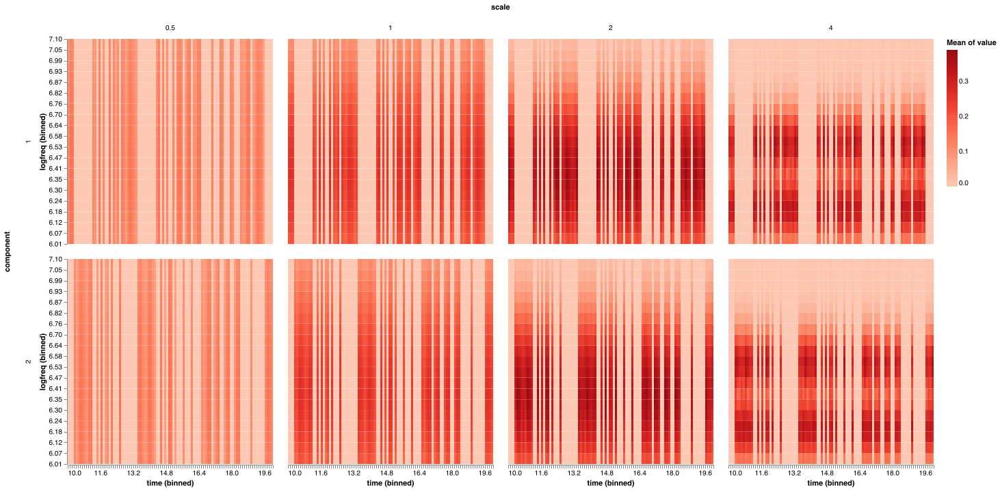

In [138]:
β = 0.8 #[0.25,0.5,0.8]
κ = 20 #[15,20]
plotaxes(result.sources.tracks[atvalue((3s, β, 10.0κ))][:,:,:,10s .. 20s],:time,:freq => logrange,:scale,:component)

WARN row encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).
WARN row encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).


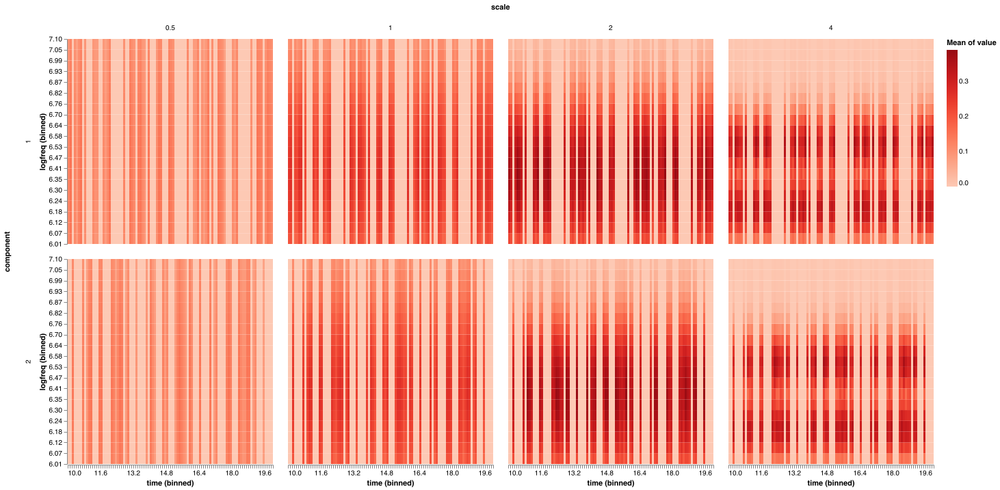

In [139]:
β = 0.5 #[0.25,0.5,0.8]
κ = 20 #[15,20]
plotaxes(result.sources.tracks[atvalue((3s, β, 10.0κ))][:,:,:,10s .. 20s],:time,:freq => logrange,:scale,:component)

WARN row encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).
WARN row encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).


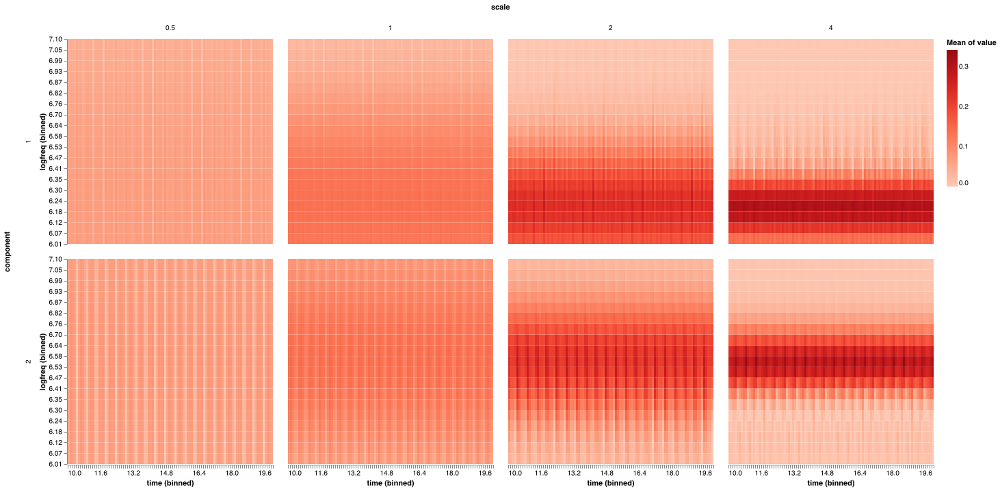

In [140]:
β = 0.8 #[0.25,0.5,0.8]
κ = 15 #[15,20]
plotaxes(result.sources.tracks[atvalue((3s, β, 10.0κ))][:,:,:,10s .. 20s],:time,:freq => logrange,:scale,:component)

WARN row encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).
WARN row encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).


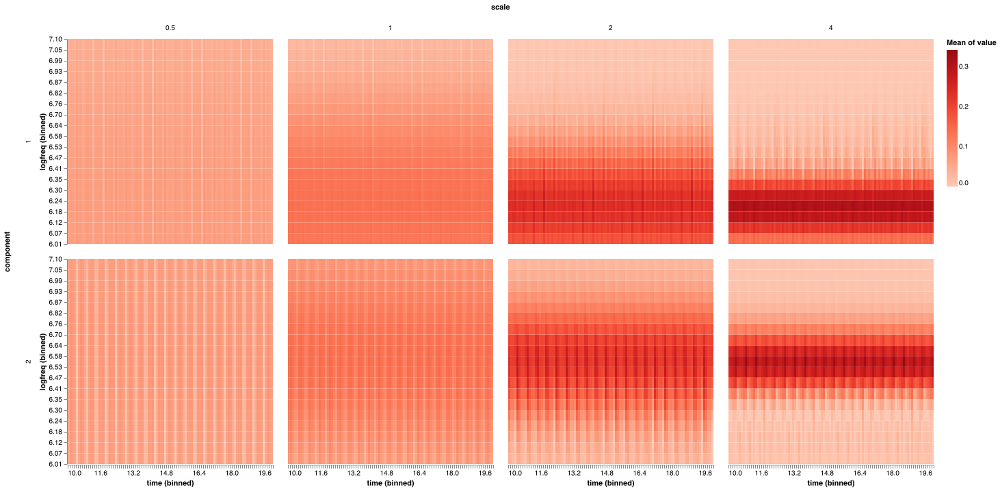

In [141]:
β = 0.5 #[0.25,0.5,0.8]
κ = 15 #[15,20]
plotaxes(result.sources.tracks[atvalue((3s, β, 10.0κ))][:,:,:,10s .. 20s],:time,:freq => logrange,:scale,:component)

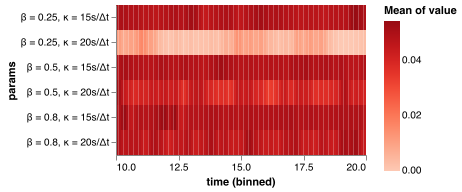

In [142]:
df |> @vlplot(:rect, width=250, height=150,
      x={field=:time, typ="quantitative", bin={step=0.1}, axis={values=[10,12.5,15,17.5,20]}}, #axis={values=[10,12.5,15,17.5,20]}},
      y={field=:params, typ="ordinal"},
      color={field=:value, aggregate="mean", typ="quantitative"},
      config={view={stroke="transparent"},
              scale={bandPaddingInner=0, bandPaddingOuter=0},
              range={heatmap={scheme="reds"}}})

In [143]:
df.label = CategoricalArray(ifelse.(df.kappa .== 150.0,"fuse","stream").*ifelse.(df.beta .== 0.5, "1", "2"))

dflimit = df[df.beta .> 0.25,:]
first(dflimit,6)

,value,time,params,beta,kappa,label
,Float64,Float64,String,Float64,Float64,Categorical…
1,0.0486066,10.05,"β = 0.5, κ = 15s/Δt",0.5,150.0,fuse1
2,0.049387,10.15,"β = 0.5, κ = 15s/Δt",0.5,150.0,fuse1
3,0.0503571,10.25,"β = 0.5, κ = 15s/Δt",0.5,150.0,fuse1
4,0.0508233,10.35,"β = 0.5, κ = 15s/Δt",0.5,150.0,fuse1
5,0.0503504,10.45,"β = 0.5, κ = 15s/Δt",0.5,150.0,fuse1
6,0.0493301,10.55,"β = 0.5, κ = 15s/Δt",0.5,150.0,fuse1


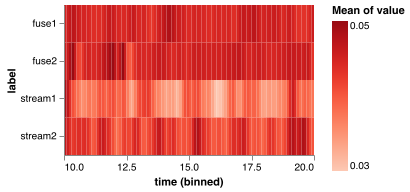

In [144]:
Ostage = (dflimit |> @vlplot(:rect, width=250, height=150,
      x={field=:time, typ="quantitative", bin={step=0.1}, axis={values=[10,12.5,15,17.5,20]}}, #axis={values=[10,12.5,15,17.5,20]}},
      y={field=:label, typ="ordinal"},
      color={field=:value, aggregate="mean", typ="quantitative"},
      config={view={stroke="transparent"},
              scale={bandPaddingInner=0, bandPaddingOuter=0},
              range={heatmap={scheme="reds"}}}))
Ostage


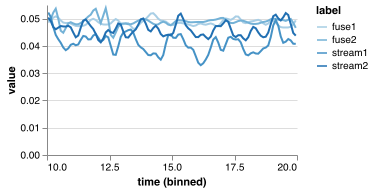

In [145]:
Ostage = (dflimit |> @vlplot(:line, width=250, height=150,
      x={field=:time, typ="quantitative", bin={step=0.1}, axis={values=[10,12.5,15,17.5,20]}}, #axis={values=[10,12.5,15,17.5,20]}},
      color={field=:label, typ="ordinal"},
      y={field=:value, typ="quantitative"},
      config={view={stroke="transparent"},
              scale={bandPaddingInner=0, bandPaddingOuter=0},
              range={heatmap={scheme="reds"}}}))


# Central model

In [21]:
p = copy(params[select_params(params,s_c_a=15,s_c_m=44,Δf=6),:])

,f_W_m_σ,f_c_m,t_c_a,t_c_m,f,t_W_m_c,t_c_x,f_c_x,t_W_m_σ_t
,Float64,Float64,Float64,Float64,Quantity…,Float64,Float64,Float64,Float64
1,5.6,0.0,0.0,0.0,500 Hz,6.0,3.0,3.0,7.0


In [192]:
Random.seed!(111819)
result = bistable_model(p,settings,intermediate_results=true);

┌ Info: 1.74% of frames (n = 8) failed to fully converge to a solution.
└ @ AuditoryBistabilityLE /Users/davidlittle/Documents/work/projects/bistable/src/AuditoryBistabilityLE/src/nmf.jl:47


In [193]:
df, = PlotAxes.asplotable(result.cortical.outweights[10s .. 40s],quantize=(100,10));
first(df,6)

,value,time,scale
,Float64,Float64,Float64
1,-2.29785e-24,10.15,0.5
2,2.15329e-24,10.46,0.5
3,-7.80706e-25,10.76,0.5
4,1.66711e-25,11.06,0.5
5,-1.64523e-26,11.36,0.5
6,-3.72632e-27,11.66,0.5


In [194]:
a = (df |> @vlplot(:rect, width=250, height=150,
      x={field=:time, typ="quantitative", bin={step=0.3}, axis=nothing}, #axis={values=[10,12.5,15,17.5,20]}},
      y={field=:scale, typ="ordinal"},
      color={field=:value, aggregate="mean", typ="quantitative"},
      config={view={stroke="transparent"},
              scale={bandPaddingInner=0, bandPaddingOuter=0},
              range={heatmap={scheme="reds"}}}));

In [195]:
df,axes = PlotAxes.asplotable(result.primary_source[10s .. 40s],:time,:freq => logrange,quantize=(600,128))
first(df,6)

,value,time,logfreq
,Float64,Float64,Float64
1,5.64e-6,10.02,6.02901
2,0.0166783,10.08,6.02901
3,0.0284418,10.13,6.02901
4,0.00143007,10.18,6.02901
5,0.0,10.23,6.02901
6,0.0,10.28,6.02901


In [196]:
len,val = result.percepts.counts

([1.5000000000000004, 1.1000000000000003, 1.3000000000000005, 1.1000000000000005, 0.9000000000000004, 9.000000000000004, 0.7000000000000002, 0.5000000000000002, 4.100000000000001, 6.700000000000002, 4.000000000000002, 5.000000000000002, 1.4000000000000004, 2.000000000000001, 2.5000000000000013, 3.5000000000000013], Bool[0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1])

In [197]:
dfl = DataFrame(value=[val[1];val],time=[0;cumsum(len)]);
dfl[!,:lagtime] = lag(dfl.time,default=0);
c = (dfl |> @vlplot(mark={:rect,clip=true},width=250,height=15,
               x={field=:time,scale={domain=[10,40]}, axis={values=[10,20,30,40]}},
               x2=:lagtime,
               color={field=:value,typ="nominal",scale={scheme="set1"}}));

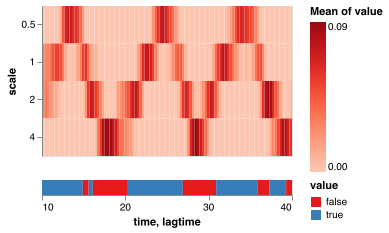

In [205]:
p = @vlplot(config={range={heatmap={scheme="reds"}},concat={spacing=6}}) + vcat(a,c)
p

In [206]:
save(joinpath(plotdir,"revision2_response_fig1b.pdf"),p)

# Peripheral model

In [222]:
p = copy(params[select_params(params,f_c_a=5,f_c_m=44,Δf=6),:])

,f_W_m_σ,f_c_m,t_c_a,t_c_m,f,t_W_m_c,t_c_x,f_c_x,t_W_m_σ_t
,Float64,Float64,Float64,Float64,Quantity…,Float64,Float64,Float64,Float64
1,5.6,44.0,0.0,0.0,500 Hz,6.0,3.0,3.0,7.0


In [208]:
#p.f_c_m .= 200

1-element Array{Float64,1}:
 200.0

In [242]:
Random.seed!(111819)
result = bistable_model(p,settings,intermediate_results=true);

In [243]:
df, = PlotAxes.asplotable(result.spect.result[10s .. 20s],:time,:freq => logrange, quantize=(200,128))
first(df,6)

,value,time,logfreq
,Float64,Float64,Float64
1,-3.23987e-25,10.02,4.52719
2,-8.42532e-26,10.08,4.52719
3,5.44268e-26,10.13,4.52719
4,1.2864e-25,10.18,4.52719
5,1.55087e-25,10.23,4.52719
6,1.42805e-25,10.28,4.52719


In [244]:
Pstage = df |> @vlplot(mark={:rect,clip=true}, width=250, height=150,
      x={field=:time, typ="quantitative", bin={step=axes[1].step}, axis=nothing}, #{values=[10,12.5,15,17.5,20]}},
      y={field=:logfreq, typ="quantitative", bin={step=axes[2].step}, 
      scale={domain=log.([450,800])}, axis={values=log.([500,600,700,800])}},
      color={field=:value, aggregate="mean", typ="quantitative"},
      config={view={stroke="transparent"},
              scale={bandPaddingInner=0, bandPaddingOuter=0},
              range={heatmap={scheme="reds"}}});